# 中国地图最正确的使用方式

气象、海洋、地球科学相关的分析必然少不了地图的可视化。
Python中常用的绘制地图和空间信息分析的库是Cartopy。

Cartopy有一个非常严重的问题，那就是自带的中国国界数据有问题，这也是很多国外开源库的普遍问题。

在做中国区域的分析时，由于九段线的位置很偏南，因此最标准的做法是同时绘制南海区域的子图。

在做一些站点展示的时候，如果只单独画上几个站点总觉得很丑，可以加上一些地形背景。

综上，今天想要用一个小例子解决这3个问题：

* 正确的中国国界线及九段线绘制
* 南海小地图绘制
* 全球地形图添加

首先加载所需要的所有库

In [1]:
import numpy as np
import pandas as pd
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeat
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from cartopy.io.shapereader import Reader, natural_earth
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from matplotlib.image import imread

定义一个绘制地图的函数，包含中国行政区划、九段线、南海子图、高分辨率地形图  

具体绘制的区域，以及南海子图的位置可以自行调整

In [5]:
def create_map():
    # --设置shp路径，数据集已公开
    shp_path = '/climate/chinese_map/'
    # --设置tif路径，数据集已公开
    tif_path = '/climate/chinese_map/'
    # --创建画图空间
    proj = ccrs.PlateCarree()  # 创建坐标系
    fig = plt.figure(figsize=(6, 8), dpi=400)  # 创建页面
    ax = fig.subplots(1, 1, subplot_kw={'projection': proj})  

    # --设置地图属性
    provinces = cfeat.ShapelyFeature(
        Reader(shp_path + 'Province_9.shp').geometries(),
        proj, edgecolor='k',
        facecolor='none'
    )
    # --加载省界线
    ax.add_feature(provinces, linewidth=0.6, zorder=2)
    # --加载分辨率为50的海岸线
    ax.add_feature(cfeat.COASTLINE.with_scale('50m'), linewidth=0.6, zorder=10)
    # --加载分辨率为50的河流~
    ax.add_feature(cfeat.RIVERS.with_scale('50m'), zorder=10)
    # --加载分辨率为50的湖泊
    ax.add_feature(cfeat.LAKES.with_scale('50m'), zorder=10)
    ax.set_extent([105, 133, 15, 45])  #可根据需求自行定义
    # ax.stock_img()  ##可直接使用低分辨率背景
    # --加载高分辨率地形
    ax.imshow(
        imread(tif_path + 'NE1_50M_SR_W.tif'),
        origin='upper', transform=proj,
        extent=[-180, 180, -90, 90]
    )
    # --设置网格点属性
    gl = ax.gridlines(
        crs=ccrs.PlateCarree(),
        draw_labels=True,
        linewidth=1.2,
        color='k',
        alpha=0.5,
        linestyle='--'
    )
    gl.top_labels = False  # 关闭顶端的经纬度标签
    gl.right_labels = False  # 关闭右侧的经纬度标签
    gl.xformatter = LONGITUDE_FORMATTER  # x轴设为经度的格式
    gl.yformatter = LATITUDE_FORMATTER  # y轴设为纬度的格式
    gl.xlocator = mticker.FixedLocator(np.arange(95, 145 + 5, 5))
    gl.ylocator = mticker.FixedLocator(np.arange(-5, 45 + 5, 5))

    # --设置南海子图
    left, bottom, width, height = 0.67, 0.16, 0.23, 0.27
    ax2 = fig.add_axes(
        [left, bottom, width, height], 
        projection=proj
    )
    ax2.add_feature(provinces, linewidth=0.6, zorder=2)
    ax2.add_feature(cfeat.COASTLINE.with_scale('50m'), linewidth=0.6, zorder=10)  # 加载分辨率为50的海岸线
    ax2.add_feature(cfeat.RIVERS.with_scale('50m'), zorder=10)  # 加载分辨率为50的河流
    ax2.add_feature(cfeat.LAKES.with_scale('50m'), zorder=10)  # 加载分辨率为50的湖泊
    ax2.set_extent([105, 125, 0, 25])
    # ax2.stock_img()  ##可直接使用低分辨率背景
    # --加载高分辨率地形
    ax2.imshow(
        imread(tif_path + 'NE1_50M_SR_W.tif'),
        origin='upper',
        transform=proj,
        extent=[-180, 180, -90, 90]
    )
    return ax

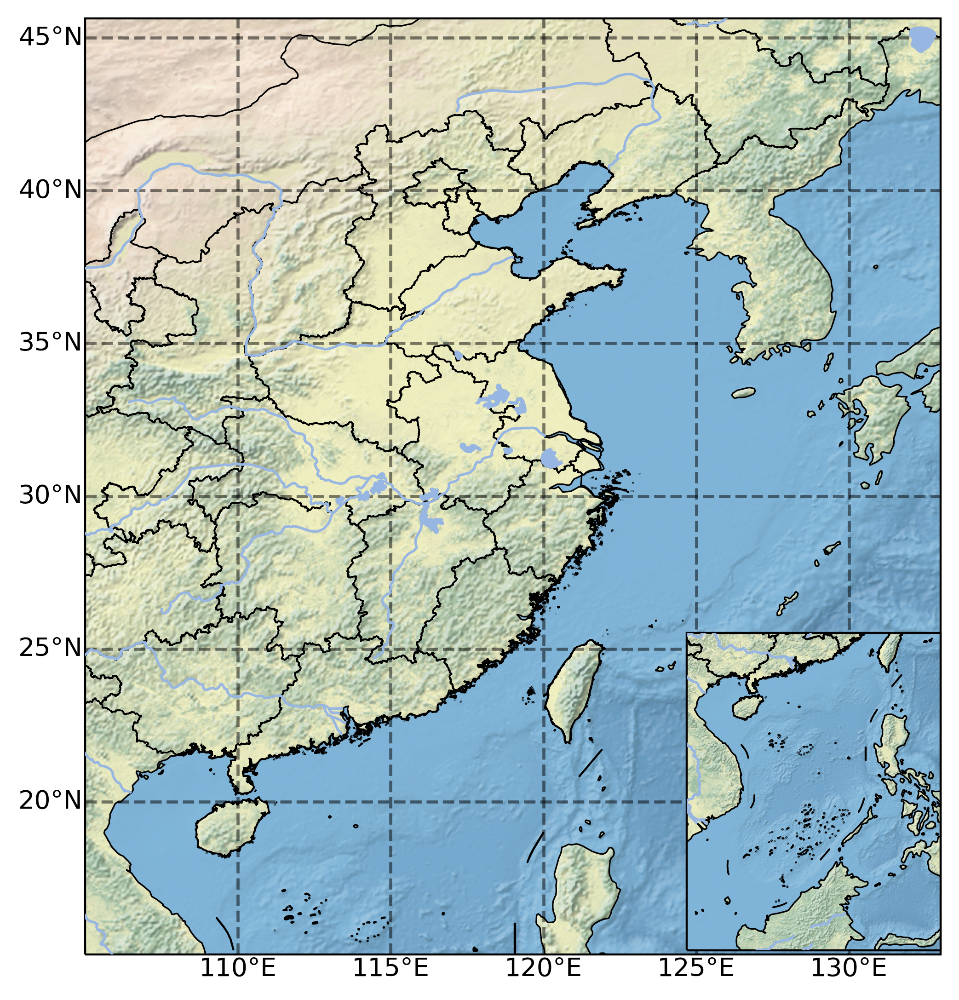

In [7]:
ax = create_map()
plt.show()

查看浮标数据

In [9]:
df = pd.read_csv('/climate/chinese_map/buyo_position.csv')
df

,lon,lat,name
0,120.6000,39.5000,QF105
1,120.0700,39.0200,QF109
2,121.1500,38.5500,QF113
3,123.3400,38.9200,QF106
4,123.5000,37.9900,QF107
5,122.0000,37.5400,QF114
6,123.5000,36.8600,QF112
7,120.4500,36.0500,QF163
8,121.3800,36.2000,QF101
9,122.0100,35.2600,QF103


绘制浮标数据到地图上

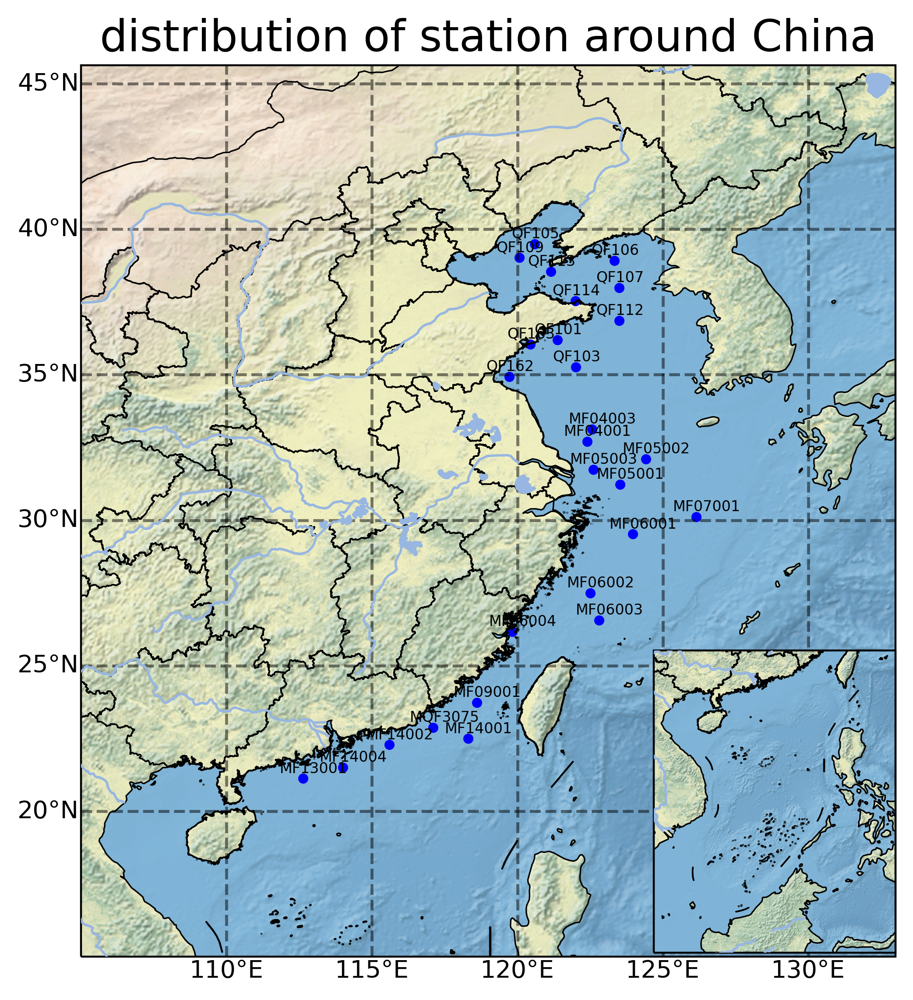

In [11]:
# --调用刚才定义的地图函数
ax = create_map()
df['lon'] = df['lon'].astype(np.float64)
df['lat'] = df['lat'].astype(np.float64)

# --绘制散点图
ax.scatter(
    df['lon'].values,
    df['lat'].values,
    marker='o',
    s=10 ,
    color ="blue"
)

# --添加浮标名称
for i, j, k in list(zip(df['lon'].values, df['lat'].values, df['name'].values)):
    ax.text(i - 0.8, j + 0.2, k, fontsize=6)
    
# --添加标题&设置字号
title = f'distribution of station around China'
ax.set_title(title, fontsize=18)
plt.show()

至此，一幅结合了中国省级行政区划，九段线，南海子图以及高分辨率地形图的结果就在上面。

这里用的是沿海浮标，所以区域主要选用了中国东部沿海，如果是陆地站点展示可以适当调整绘制区域。

【END】